In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
import plotly.express as px
import plotly.graph_objs as go
import plotly
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True) 

# GİRİŞ
## Çalışanın şirketten ayrılıp ayrılmayacağını sınıflandırabilen makine öğrenmesi modelinin oluşturulması
- Bir çalışanın bir kuruluş içinde tutulmasını öngörerek, çalışanın şirketi terk edip etmeyeceği üzerinde durur. Şirket için önceki çalışanların verilerini kullanır ve bir kalıp bularak işten ayrılmayı evet veya hayır şeklinde öngörür.

- Bağımlı değişken: **left** - Çalışan şirketten ayrıldı mı? (1: Evet, 0: Hayır)

# Veriyi Anlama

In [2]:
human_resources = pd.read_csv("data/human_resources.csv")
hr=human_resources.copy()
df = hr.copy()

#### Veriler 14.999 çalışan ve 11 özellik içeriyor

In [3]:
df.shape

(14999, 11)

#### Her satır bir çalışanı temsil eder, her sütun çalışan özeliklerini (11 adet) içerir:
   - empid - Çalışan ID'si
   - satisfaction_level - Çalışan memnuniyet seviyesi (0-1 arasında değer)
   - last_evaluation - Çalışanın işi hakkındaki son değerlendirmesi (0-1 arasında değer)
   - number_project - Çalışanın şirkette hazırladığı projeler
   - average_montly_hours - Çalışanın aylık ortalama çalıştığı saat
   - time_spend_company - Çalışanın şirkette çalıştığı süre
   - Work_accident - Çalışan kaza geçirdi mi? (1: Evet, 0: Hayır)
   - left - Çalışan şirketten ayrıldı mı? (1: Evet, 0: Hayır)
   - promotion_last_5years - Çalışan son 5 yılda terfi aldı mı? (1: Evet, 0: Hayır)
   - dept - Çalışanın çalıştığı departman
   - salary - Çalışanın maaşı (High/Medium/Low)

# Veri Görselleştirme

#### İşten ayrılan ve ayrılmayanların sayısı, yüzdesi:

Positive examples = 3571
Negative examples = 11427
Pos/Neg = 31.25%


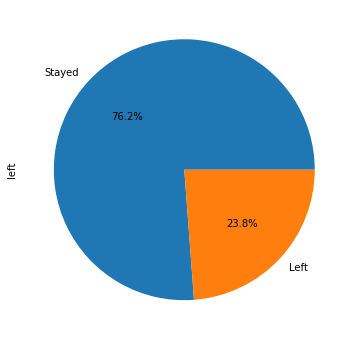

In [4]:
plt.figure(figsize=(10,6))
pos = df[df["left"] == 1].shape[0]
neg = df[df["left"] == 0].shape[0]
print("Positive examples = {}".format(pos))
print("Negative examples = {}".format(neg))
print("Pos/Neg = {:.2f}%".format((pos / neg) * 100))
#plt.xlabel("Left (0 = No, 1= Yes)")
labels = ['Stayed','Left']
df['left'].value_counts().plot.pie(autopct="%1.1f%%", labels=labels)

#### Departmana göre işten ayrılan ve ayrılmayanların sütun grafiği ile gösterilmesi:

<Figure size 720x432 with 0 Axes>

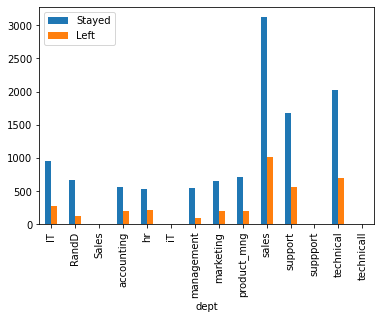

In [5]:
plt.figure(figsize=(10,6))
Gender=['Stayed','Left']
pd.crosstab(df.dept,df.left).plot(kind='bar')
plt.legend(Gender,loc=2)

#### İş kazası geçirmiş olan çalışanların departmana göre dağılımı:

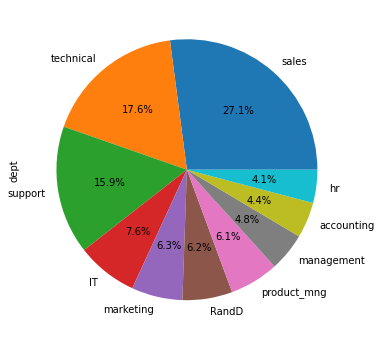

In [6]:
plt.figure(figsize=(10,6))
df_wa=df[df['Work_accident'] == 1.0]
df_wa['dept'].value_counts().plot.pie(autopct="%1.1f%%")

#### Çalışanın maaş durumuna göre işten ayrılma oranları:

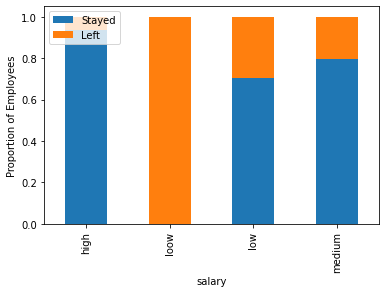

In [7]:
table=pd.crosstab(df.salary, df.left)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
plt.ylabel('Proportion of Employees')
Gender=['Stayed','Left']
plt.legend(Gender,loc=2)

#### Numeric değişkenlerin histogram grafiği:

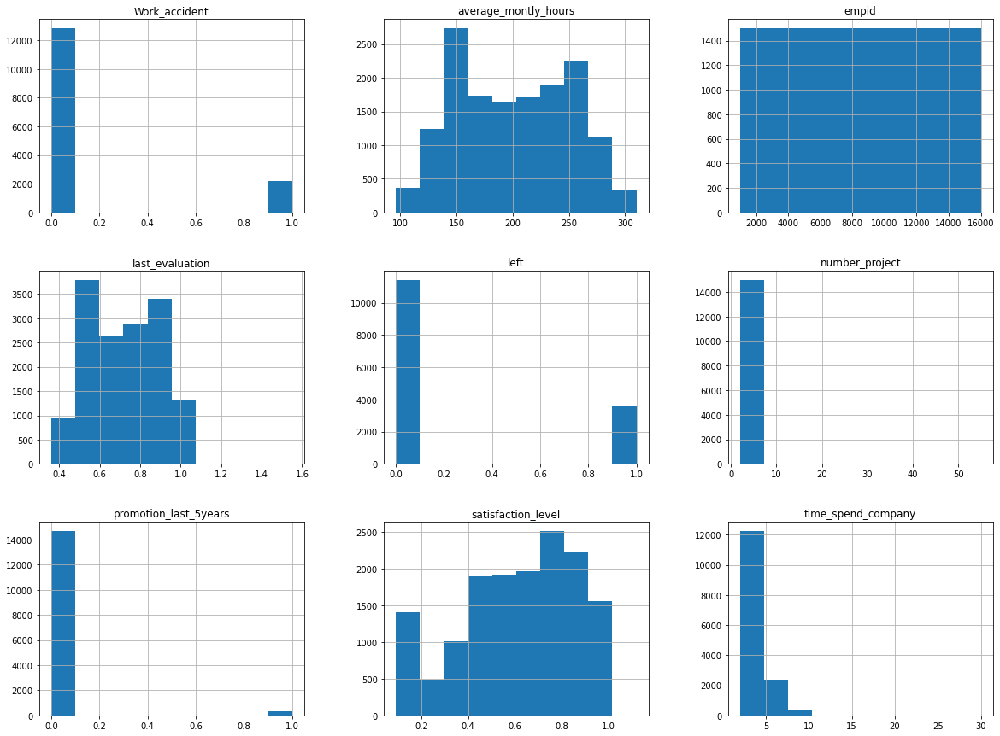

In [8]:
num_bins = 10

df.hist(bins=num_bins, figsize=(20,15))
#plt.savefig("histogram plots")
plt.show()

#### Çalışanın maaş durumu ve memnuniyet seviyesini içeren kutu grafiği:

In [9]:
fig = px.box(df,x="salary", y="satisfaction_level")
fig.update_traces(quartilemethod="exclusive")
fig.show()

#### 2D DENSITY PLOT

In [10]:
Q1 = df.number_project.quantile(0.25)
Q2 = df.number_project.quantile(0.5)
Q3 = df.number_project.quantile(0.75)
Q4 = df.number_project.quantile(1)
IQR = Q3 - Q1
print("Q1:", Q1, " ,  Q3:", Q3)
print("Q2:", Q2, " ,  Q4:", Q4)
print("IQR", IQR)
print("number_project için: \nAlt sınır: Q1 - 1.5 * IQR", Q1 - 1.5 * IQR)
print("Üst sınır: Q3 + 1.5 * IQR", Q3 + 1.5 * IQR)

Q1: 3.0  ,  Q3: 5.0
Q2: 4.0  ,  Q4: 55.0
IQR 2.0
number_project için: 
Alt sınır: Q1 - 1.5 * IQR 0.0
Üst sınır: Q3 + 1.5 * IQR 8.0


In [11]:
a=1.5*IQR
b = Q3+a
df = df.drop(df[df.number_project > b].index)

In [12]:
import plotly.figure_factory as ff

import numpy as np
fig = ff.create_2d_density(
    df.satisfaction_level, df.number_project,
    hist_color='rgb(0, 0, 0)', point_size=3
)
fig.update_layout(
    xaxis_title="satisfaction_level",
    yaxis_title="number_project"
)
fig.show()

In [13]:
fig = ff.create_2d_density(
    df.average_montly_hours, df.number_project,
    hist_color='rgb(0, 0, 0)', point_size=3
)
fig.update_layout(
    xaxis_title="average_montly_hours",
    yaxis_title="number_project"
)
fig.show()

#### Parallel Coordinates Plot:

In [14]:
data = [
    go.Parcoords(
        line = dict(color = df.left, colorscale = 'viridis'),
        dimensions = list([
            dict(range = [df.average_montly_hours.min(),df.average_montly_hours.max()],
                label = 'average_montly_hours', values = df['average_montly_hours']),
            dict(range = [df.number_project.min(),df.number_project.max()],
                label = 'number_project', values = df['number_project']),
            dict(range = [df.satisfaction_level.min(),df.satisfaction_level.max()],
                label = 'satisfaction_level', values = df['satisfaction_level']),
            dict(range = [0,1],
                label = 'left', values = df['left'])
        ])
    )
]

layout = go.Layout(
    plot_bgcolor = '#E5E5E5',
    paper_bgcolor = '#E5E5E5'
)

fig = go.Figure(data = data, layout = layout)
fig.show()

## Veri Ön İşleme (Data Preprocessing):

In [15]:
df.head()

,empid,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,dept,salary
0,1001,0.38,0.53,2.0,157.0,3.0,0.0,1.0,0,sales,low
1,1002,0.80,0.86,5.0,262.0,6.0,0.0,1.0,0,sales,medium
2,1003,0.11,0.88,7.0,272.0,4.0,0.0,1.0,0,sales,medium
3,1004,0.72,0.87,5.0,223.0,5.0,0.0,1.0,0,sales,low
4,1005,0.37,0.52,2.0,159.0,3.0,0.0,1.0,0,sales,low


#### Daha doğru bir model oluşması için empid alanını siliyorum.

In [16]:
df["empid"].value_counts().sort_values()

2047     1
4030     1
1983     1
14281    1
6141     1
        ..
12294    1
10245    1
8196     1
4130     1
2049     1
Name: empid, Length: 14998, dtype: int64

In [17]:
df.drop("empid", inplace=True, axis=1)
df.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,dept,salary
0,0.38,0.53,2.0,157.0,3.0,0.0,1.0,0,sales,low
1,0.80,0.86,5.0,262.0,6.0,0.0,1.0,0,sales,medium
2,0.11,0.88,7.0,272.0,4.0,0.0,1.0,0,sales,medium
3,0.72,0.87,5.0,223.0,5.0,0.0,1.0,0,sales,low
4,0.37,0.52,2.0,159.0,3.0,0.0,1.0,0,sales,low


#### Sütunların türü ve toplam eksik değerleri sayıları aşağıdaki gibidir.

In [18]:
print("\033[1m" + "\033[94m" + "Data types:")
print("\033[30m" + "{}\n".format(df.dtypes))
print("\033[1m" + "\033[94m" + "Sum of null values in each column:")
print("\033[30m" + "{}".format(df.isnull().sum()))

Data types:
satisfaction_level       float64
last_evaluation          float64
number_project           float64
average_montly_hours     float64
time_spend_company       float64
Work_accident            float64
left                     float64
promotion_last_5years      int64
dept                      object
salary                    object
dtype: object

Sum of null values in each column:
satisfaction_level       6
last_evaluation          3
number_project           4
average_montly_hours     2
time_spend_company       2
Work_accident            2
left                     1
promotion_last_5years    0
dept                     1
salary                   0
dtype: int64


#### %70'in üzerinde eksik değer olan değişkenleri veri kümesinden siler.

In [19]:
tr = len(df) * .3
df.dropna(thresh = tr, axis = 1, inplace = True)

#### Hatalı yazımların düzeltilmesi:

In [20]:
df["salary"].value_counts()

low       7314
medium    6446
high      1237
loow         1
Name: salary, dtype: int64

In [21]:
dict = {'loow': 'low'}
df['salary'] = df['salary'].replace(dict)

In [22]:
df["dept"].value_counts()

sales          4137
technical      2718
support        2226
IT             1226
product_mng     902
marketing       858
RandD           787
accounting      767
hr              739
management      630
Sales             3
suppport          2
technicall        1
iT                1
Name: dept, dtype: int64

In [23]:
dic = {'Sales': 'sales','suppport': 'support','technicall': 'technical','iT': 'IT'}
df['dept'] = df['dept'].replace(dic)
df["dept"].value_counts()

sales          4140
technical      2719
support        2228
IT             1227
product_mng     902
marketing       858
RandD           787
accounting      767
hr              739
management      630
Name: dept, dtype: int64

#### Departman (dept), işten ayrılma durumu (left) ve kaza geçirme durumu (Work_accident) NaN olanların silinmesi:

In [24]:
df.dropna(subset=['dept'], inplace=True)
df.dropna(subset=['left'], inplace=True)
df.dropna(subset=['Work_accident'], inplace=True)

In [25]:
df.isnull().sum()

satisfaction_level       6
last_evaluation          2
number_project           2
average_montly_hours     2
time_spend_company       2
Work_accident            0
left                     0
promotion_last_5years    0
dept                     0
salary                   0
dtype: int64

#### Verinin özet istatistikleri:
   - Değerlerinin **0-1** arası olması gereken **satisfaction_level** ve **last_evaluation** özelliklerinin **max** değerleri **1**'den büyüktür.

In [26]:
df.describe()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years
count,14989.000000,14993.000000,14993.000000,14993.000000,14993.000000,14995.000000,14995.000000,14995.000000
mean,0.612793,0.716162,3.803242,201.040619,3.498566,0.144582,0.238079,0.021274
std,0.248629,0.171314,1.232659,49.946727,1.460257,0.351690,0.425922,0.144300
min,0.090000,0.360000,2.000000,96.000000,2.000000,0.000000,0.000000,0.000000
25%,0.440000,0.560000,3.000000,156.000000,3.000000,0.000000,0.000000,0.000000
50%,0.640000,0.720000,4.000000,200.000000,3.000000,0.000000,0.000000,0.000000
75%,0.820000,0.870000,5.000000,245.000000,4.000000,0.000000,0.000000,0.000000
max,1.120000,1.550000,7.000000,310.000000,10.000000,1.000000,1.000000,1.000000


   - **satisfaction_level** ve **last_evaluation** için 1'den büyük olan değerleri **mean** ile doldurur:

In [27]:
df['satisfaction_level'].values[df['satisfaction_level'] > 1] = df['satisfaction_level'].mean()
df['last_evaluation'].values[df['last_evaluation'] > 1] = df['last_evaluation'].mean()

In [28]:
df.describe()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years
count,14989.000000,14993.000000,14993.000000,14993.000000,14993.000000,14995.000000,14995.000000,14995.000000
mean,0.612760,0.716107,3.803242,201.040619,3.498566,0.144582,0.238079,0.021274
std,0.248594,0.171178,1.232659,49.946727,1.460257,0.351690,0.425922,0.144300
min,0.090000,0.360000,2.000000,96.000000,2.000000,0.000000,0.000000,0.000000
25%,0.440000,0.560000,3.000000,156.000000,3.000000,0.000000,0.000000,0.000000
50%,0.640000,0.720000,4.000000,200.000000,3.000000,0.000000,0.000000,0.000000
75%,0.820000,0.870000,5.000000,245.000000,4.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,7.000000,310.000000,10.000000,1.000000,1.000000,1.000000


In [29]:
df.groupby(['left','dept']).agg({'satisfaction_level':'mean'})

satisfaction_level
left dept                           
0.0  IT                     0.677170
     RandD                  0.653799
     accounting             0.647211
     hr                     0.666679
     management             0.654861
     marketing              0.669679
     product_mng            0.658466
     sales                  0.668601
     support                0.673548
     technical              0.668356
1.0  IT                     0.411868
     RandD                  0.432810
     accounting             0.402598
     hr                     0.433395
     management             0.422857
     marketing              0.453153
     product_mng            0.481566
     sales                  0.447663
     support                0.450901
     technical              0.431853

In [30]:
df.groupby(['left','Work_accident','dept']).agg({'satisfaction_level':'mean'})

satisfaction_level
left Work_accident dept                           
0.0  0.0           IT                     0.676345
                   RandD                  0.657823
                   accounting             0.653613
                   hr                     0.666946
                   management             0.647143
                   marketing              0.670342
                   product_mng            0.652496
                   sales                  0.669241
                   support                0.673424
                   technical              0.670406
     1.0           IT                     0.681419
                   RandD                  0.636210
                   accounting             0.612184
                   hr                     0.665244
                   management             0.689592
                   marketing              0.666929
                   product_mng            0.686667
                   sales                  0.665545
                   support                0.674085
                   technical              0.658473
1.0  0.0           IT                     0.409242
                   RandD                  0.452613
                   accounting             0.398000
                   hr                     0.434952
                   management             0.414419
                   marketing              0.443368
                   product_mng            0.479365
                   sales                  0.449824
                   support                0.451393
                   technical              0.429879
     1.0           IT                     0.488889
                   RandD                  0.213000
                   accounting             0.502222
                   hr                     0.387143
                   management             0.568000
                   marketing              0.642000
                   product_mng            0.527778
                   sales                  0.402174
                   support                0.442581
                   technical              0.471515

#### Number olan değişkenlerin NaN değerlerinin işten ayrılma durumu, iş kazası geçirme durumu ve bulunduğu departmana göre gruplayarak ortalama değerinin atanması:

In [32]:
for col in df.select_dtypes(include=np.number).columns.tolist():
    df[col] = df.groupby(['left','Work_accident','dept'])[col].apply(lambda x: x.fillna(x.mean()))

###### Artık eksik değer bulunmamaktadır.

In [33]:
df.isnull().sum()

satisfaction_level       0
last_evaluation          0
number_project           0
average_montly_hours     0
time_spend_company       0
Work_accident            0
left                     0
promotion_last_5years    0
dept                     0
salary                   0
dtype: int64

#### Departmana göre diğer özelliklerin ortalama değerleri:

In [34]:
df_mean=df.groupby('dept').mean()
df_mean

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years
dept,,,,,,,,
IT,0.618142,0.716830,3.816626,202.215974,3.468623,0.133659,0.222494,0.002445
RandD,0.619822,0.712122,3.853875,200.800508,3.367217,0.170267,0.153748,0.034307
accounting,0.582151,0.717718,3.825293,201.162973,3.522816,0.125163,0.265971,0.018253
hr,0.598809,0.709153,3.654939,198.684709,3.356138,0.120433,0.290934,0.020298
management,0.621349,0.724000,3.860317,201.249206,4.303175,0.163492,0.144444,0.109524
marketing,0.618390,0.715834,3.688448,199.303384,3.571762,0.159860,0.236873,0.050175
product_mng,0.619634,0.714929,3.807095,199.965632,3.475610,0.146341,0.219512,0.000000
sales,0.614487,0.709725,3.776519,200.900758,3.534163,0.141787,0.244928,0.024155
support,0.618061,0.722977,3.804221,200.737315,3.394252,0.154917,0.249214,0.008981


#### Departmanlardan ayrılan çalışan miktarları:

In [35]:
pd.crosstab(df.dept, df.left)

left,0.0,1.0
dept,,
IT,954,273
RandD,666,121
accounting,563,204
hr,524,215
management,539,91
marketing,654,203
product_mng,704,198
sales,3126,1014
support,1672,555


# Veri Görselleştirme

- Veri temizleme sonrasında verinin görselleştirilmesi:

#### Departmana göre işten ayrılan ve ayrılmayanların sütun grafiği ile gösterilmesi:

<Figure size 720x432 with 0 Axes>

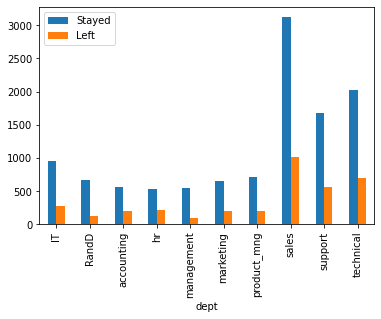

In [36]:
plt.figure(figsize=(10,6))
Gender=['Stayed','Left']
pd.crosstab(df.dept,df.left).plot(kind='bar')
plt.legend(Gender,loc=2)

#### İş kazası geçirmiş olan çalışanların departmana göre dağılımı:

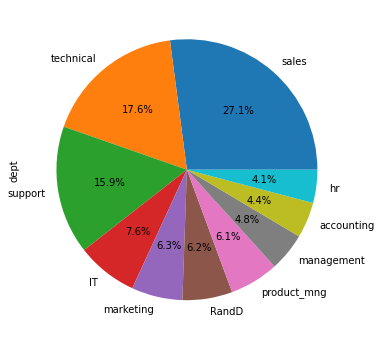

In [37]:
plt.figure(figsize=(10,6))
df_wa=df[df['Work_accident'] == 1.0]
df_wa['dept'].value_counts().plot.pie(autopct="%1.1f%%")

#### Çalışanın maaş durumuna göre işten ayrılma oranları:

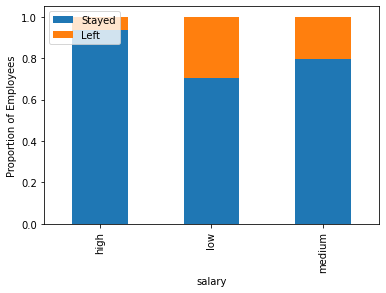

In [38]:
table=pd.crosstab(df.salary, df.left)
table.div(table.sum(1).astype(float), axis=0).plot(kind='bar', stacked=True)
plt.ylabel('Proportion of Employees')
Gender=['Stayed','Left']
plt.legend(Gender,loc=2)

#### Çalışanın maaş durumu ve memnuniyet seviyesini içeren kutu grafiği:

In [39]:
fig = px.box(df,x="salary", y="satisfaction_level")
fig.update_traces(quartilemethod="exclusive")
fig.show()

#### Çalışanın maaş durumu ve memnuniyet seviyesini işten ayrılma durumuna göre gruplayan kutu grafiği:

In [40]:
fig = px.box(df, x="dept",y="satisfaction_level", color="left")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

#### SUNBURST

In [41]:
import plotly.express as px
fig = px.sunburst(df, path=['dept', 'salary'], values='satisfaction_level')
fig.show()

#### DISTPLOT

In [42]:
import plotly.figure_factory as ff
import numpy as np

hist_data = [df.satisfaction_level, df.number_project, df.average_montly_hours, df.time_spend_company]

group_labels = ['satisfaction_level', 'number_project', 'average_montly_hours', 'time_spend_company']

# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=[.1, .25, .5, 1])
fig.show()

#### KPI (performans göstergesi) : 
   - Bir departmanda işten ayrılanların sayısının o departmandaki toplam çalışan sayısına bölünmesi ile elde edilen değer.

In [43]:
df_KPI = pd.DataFrame(columns = df['dept'].unique().tolist()) #KPI degerinin tutulması icin olusturulan df
df_KPI.loc['KPI']=0
df_KPI

,sales,accounting,hr,technical,support,management,IT,product_mng,marketing,RandD
KPI,0,0,0,0,0,0,0,0,0,0


In [44]:
df_l=df[df['left'] == 1.0] #sadece isten ayrilanlarin bulundugu df

for dep in df['dept'].unique().tolist():
    x=df_l[df_l['dept'] == dep]
    left = len(x.index)
    y=df[df['dept'] == dep]
    empCount = len(y.index)
    KPI=left/empCount
    df_KPI[dep]=KPI

In [45]:
df_KPI

,sales,accounting,hr,technical,support,management,IT,product_mng,marketing,RandD
KPI,0.244928,0.265971,0.290934,0.255976,0.249214,0.144444,0.222494,0.219512,0.236873,0.153748


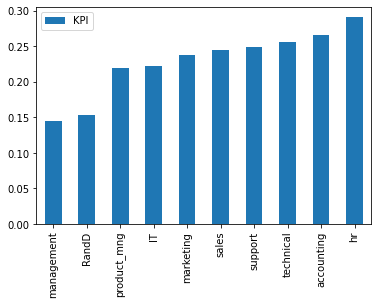

In [46]:
df_KPI.T.sort_values('KPI').plot.bar()

## Kategorik Değişkenlerin Dönüştürülmesi 
### Label Encoder yönteminin uygulanması:

In [49]:
from sklearn import preprocessing   
le = preprocessing.LabelEncoder()

for col in df.select_dtypes(include=object).columns.tolist():
    df[col] = le.fit_transform(df[col])

df.head(5) 

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,dept,salary
0,0.38,0.53,2.0,157.0,3.0,0.0,1.0,0,7,1
1,0.80,0.86,5.0,262.0,6.0,0.0,1.0,0,7,2
2,0.11,0.88,7.0,272.0,4.0,0.0,1.0,0,7,2
3,0.72,0.87,5.0,223.0,5.0,0.0,1.0,0,7,1
4,0.37,0.52,2.0,159.0,3.0,0.0,1.0,0,7,1


In [265]:
from sklearn.externals import joblib 
joblib.dump(le, 'labelencoder.pkl') 

['labelencoder.pkl']

## Veriyi Ölçeklendirme (Scaling):

In [50]:
df.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,dept,salary
0,0.38,0.53,2.0,157.0,3.0,0.0,1.0,0,7,1
1,0.80,0.86,5.0,262.0,6.0,0.0,1.0,0,7,2
2,0.11,0.88,7.0,272.0,4.0,0.0,1.0,0,7,2
3,0.72,0.87,5.0,223.0,5.0,0.0,1.0,0,7,1
4,0.37,0.52,2.0,159.0,3.0,0.0,1.0,0,7,1


In [51]:
from sklearn import preprocessing   
scaler = preprocessing.MinMaxScaler()

for col in df.columns:
    scaler.fit(df[[col]])
    df[col] = scaler.transform(df[[col]])

In [266]:
joblib.dump(scaler, 'scaler.pkl') 

['scaler.pkl']

In [52]:
df.head()

,satisfaction_level,last_evaluation,number_project,average_montly_hours,time_spend_company,Work_accident,left,promotion_last_5years,dept,salary
0,0.318681,0.265625,0.0,0.285047,0.125,0.0,1.0,0.0,0.777778,0.5
1,0.780220,0.781250,0.6,0.775701,0.500,0.0,1.0,0.0,0.777778,1.0
2,0.021978,0.812500,1.0,0.822430,0.250,0.0,1.0,0.0,0.777778,1.0
3,0.692308,0.796875,0.6,0.593458,0.375,0.0,1.0,0.0,0.777778,0.5
4,0.307692,0.250000,0.0,0.294393,0.125,0.0,1.0,0.0,0.777778,0.5


In [53]:
df.isnull().sum()

satisfaction_level       0
last_evaluation          0
number_project           0
average_montly_hours     0
time_spend_company       0
Work_accident            0
left                     0
promotion_last_5years    0
dept                     0
salary                   0
dtype: int64

### Correlations

In [54]:
df_HR_trans = df.copy()
correlations = df_HR_trans.corr()['left'].sort_values()
print('Most Positive Correlations: \n', correlations.tail(5))
print('\nMost Negative Correlations: \n', correlations.head(5))

Most Positive Correlations: 
 number_project          0.023556
dept                    0.032026
average_montly_hours    0.071402
time_spend_company      0.144687
left                    1.000000
Name: left, dtype: float64

Most Negative Correlations: 
 satisfaction_level      -0.388675
Work_accident           -0.154567
promotion_last_5years   -0.061796
salary                  -0.001171
last_evaluation          0.006568
Name: left, dtype: float64


#### Faktörler arasındaki korelasyonu görselleştirmek için ısı haritası:

(10.0, 0.0)

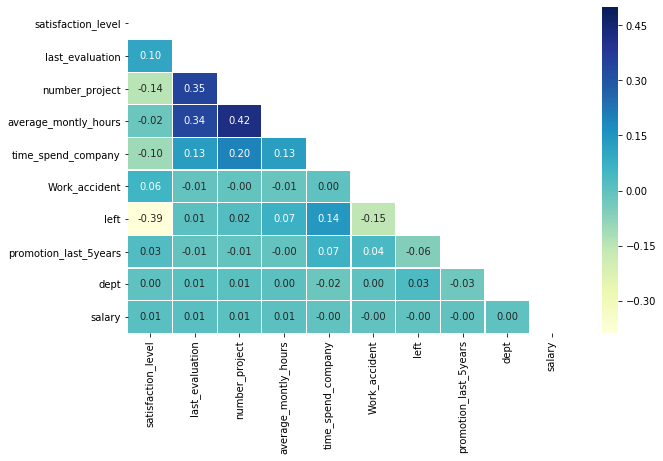

In [55]:
corr = df.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
# Heatmap
plt.figure(figsize=(10, 6))
ax=sns.heatmap(corr,
            vmax=.5,
            mask=mask,
            annot=True, fmt='.2f',
            linewidths=.2, cmap="YlGnBu")
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

# Makine Öğrenmesi Algoritmalarının Uygulanması
   - Algoritmalara ait kütüphanelerin yüklenmesi,
   - Veri kümesinin test ve train olarak ayrılması.


In [56]:
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import train_test_split
X=df.drop('left', axis=1)
y=df['left']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state=45,stratify=y)
#stratify: üretilen örnekteki değerlerin oranı, parametreye sağlanan değerlerin oranıyla aynı olacak şekilde bir bölünme yapar

In [57]:
lr = LogisticRegression()
lr.fit(X_train,y_train)
lr_score = lr.score(X_test,y_test)
print("Test Accuracy of LR Algorithm: {:.2f}%".format(lr_score*100))

C:\Users\IlknurKaraduman\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning:

Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.



Test Accuracy of LR Algorithm: 76.58%


In [58]:
nb = GaussianNB()
nb.fit(X_train, y_train)
nb_score = nb.score(X_test,y_test)
print("Test Accuracy of Naive Bayes: {:.2f}%".format(nb_score*100))

Test Accuracy of Naive Bayes: 78.55%


In [59]:
dtc = DecisionTreeClassifier()
dtc.fit(X_train, y_train)
dtc_score = dtc.score(X_test, y_test)
print("Decision Tree Test Accuracy {:.2f}%".format(dtc_score*100))

Decision Tree Test Accuracy 98.21%


In [60]:
rf = RandomForestClassifier(n_estimators = 100, random_state = 1)
rf.fit(X_train, y_train)
rf_score = rf.score(X_test, y_test)
print("Random Forest Algorithm Accuracy Score: {:.2f}%".format(rf_score*100))

Random Forest Algorithm Accuracy Score: 99.36%


In [61]:
nn = MLPClassifier()
nn.fit(X_train, y_train)
nn_score = nn.score(X_test, y_test)
print("MLP Classifier Accuracy Score: {:.2f}%".format(nn_score*100))

MLP Classifier Accuracy Score: 96.59%


C:\Users\IlknurKaraduman\Anaconda3\lib\site-packages\sklearn\neural_network\multilayer_perceptron.py:566: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



#### Tüm sonuçların bir arada olduğu veri görselleştirme:

In [62]:
methods_accuracy = {
    "Logistic Regression":lr_score,
    "Naive Bayes" : nb_score,
    "Decision Tree" : dtc_score,
    "Random Forest" : rf_score,
    "MLP Classifier" : nn_score,
}

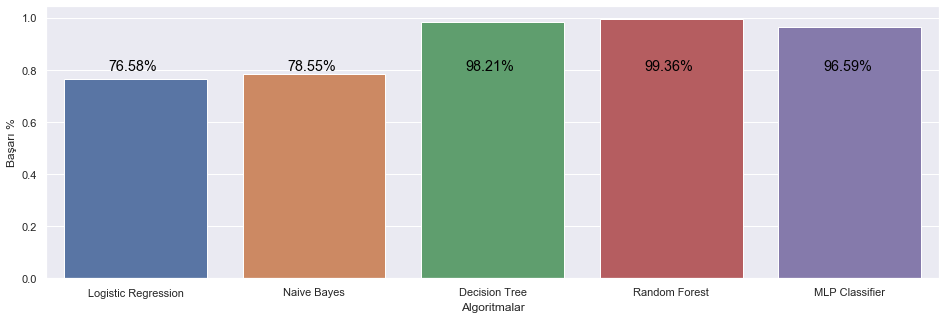

In [63]:
methods = ["Logistic Regression", "Naive Bayes", "Decision Tree", "Random Forest", "MLP Classifier"]
accuracy = [lr_score, nb_score, dtc_score, rf_score, nn_score]

sns.set()
plt.figure(figsize=(16,5))
plt.ylabel("Başarı %")
plt.xlabel("Algoritmalar")
sns.barplot(x=methods, y=accuracy, palette="deep")
for line in range(len(methods)):
     plt.text(line-0.15, # x
              0.80, # y
             "{:.2f}%".format(accuracy[line]*100), # yazdırılacak değer
             horizontalalignment='left',
              size='large',
             color="black",
             )   
plt.show()

##### En iyi başarı oranını veren algoritma %99.36 ile Random Forest oldu.

## Precision and Recall: Kesinlik ve Duyarlılık

- TP/(TP+FP) = **Precision** : Ayrıldı denilenlerin gerçekten kaçı ayrıldı
- TP/(TP+FN) = **Recall** : Ayrılanları doğru tespit etme oranı

Bir sınıflandırmanın doğruluğunu değerlendirmek için **confusion matrix (karışıklık matrisi)** oluşturuyoruz

In [64]:
#Precison Recall Scores for Random Forest
from sklearn.metrics import classification_report
print(classification_report(y_test, rf.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.99      1.00      1.00      2856
         1.0       1.00      0.98      0.99       893

    accuracy                           0.99      3749
   macro avg       1.00      0.99      0.99      3749
weighted avg       0.99      0.99      0.99      3749



(2.0, 0.0)

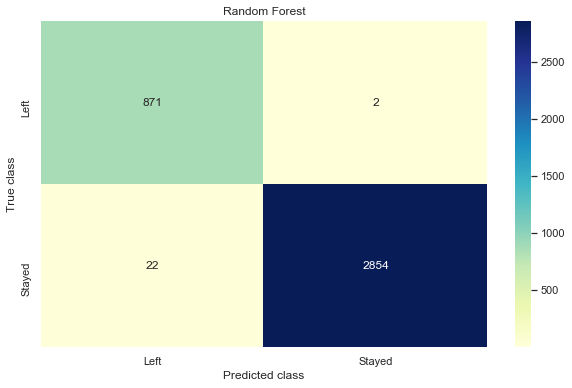

In [65]:
plt.figure(figsize=(10,6))
import sklearn.metrics as metrics

#Confusion Matrix for Random Forest
y_pred = rf.predict(X_test)
from sklearn.metrics import confusion_matrix
import seaborn as sns
forest_cm = metrics.confusion_matrix(y_pred, y_test, [1,0])
ax = sns.heatmap(forest_cm, annot=True, cmap="YlGnBu" ,fmt='g', xticklabels = ["Left", "Stayed"] , yticklabels = ["Left", "Stayed"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Random Forest')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [66]:
print('Accuracy of Random Forest on test set: {:.2f}'.format(rf.score(X_test, y_test)*100))

Accuracy of Random Forest on test set: 99.36


#### Random Forest için  Confusion Matrix, 
- **871+2854 doğru** tahminimize ve **22+2 yanlış** tahminlere sahip olduğumuzu söylüyor. Başka bir deyişle, **% 99.36'lik bir doğruluk** vardır.

In [67]:
#PRScores for Logistic Regression
print(classification_report(y_test, lr.predict(X_test)))

              precision    recall  f1-score   support

         0.0       0.80      0.93      0.86      2856
         1.0       0.52      0.23      0.32       893

    accuracy                           0.77      3749
   macro avg       0.66      0.58      0.59      3749
weighted avg       0.73      0.77      0.73      3749



(2.0, 0.0)

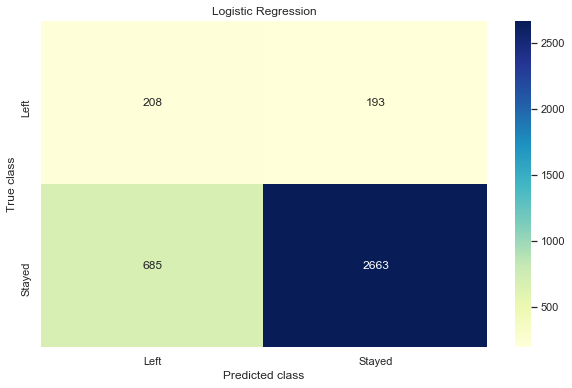

In [68]:
plt.figure(figsize=(10,6))
#Confusion Matrix for Logistic Regression
logreg_y_pred = lr.predict(X_test)
logreg_cm = metrics.confusion_matrix(logreg_y_pred, y_test, [1,0])
ax= sns.heatmap(logreg_cm, annot=True, cmap="YlGnBu" ,fmt='g', xticklabels = ["Left", "Stayed"] , yticklabels = ["Left", "Stayed"] )
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.title('Logistic Regression')
plt.savefig('logistic_regression')
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [69]:
print('Accuracy of Logistic Regression Classifier on test set: {:.2f}'.format(lr.score(X_test, y_test)*100))

Accuracy of Logistic Regression Classifier on test set: 76.58


#### Logistic Regression için Confusion Matrix, 
- **208+2663 doğru** tahminimize ve **685+193 yanlış** tahminlere sahip olduğumuzu söylüyor. Başka bir deyişle, **% 76.58'lük bir doğruluk** vardır.

## MCC
- Confusion Matrix deki dört değerin tümünü dikkate alır ve yüksek bir değer (1'e yakın), her iki sınıfın da iyi tahmin edildiği anlamına gelir.
- MCC değeri her zaman -1 ile 1 arasındadır.
- 0: sınıflandırıcının rastgele çevirmesinden daha iyi olmadığı anlamına gelir. 

![](https://miro.medium.com/max/1400/1*8E2rPn_ccOqGuPYj1gBTAg.png)
- **accuracy** ve **F1 score** istatistiklerde yaygın olarak kullanılsa bile her ikisi de yanıltıcı olabilir, çünkü son puan hesaplamalarında Confusion Matrix'inin dört sınıfının boyutunu tam olarak dikkate almazlar.
- **MCC**; formulündeki her bir Confusion Matrix sınıfının oranını göz önünde bulundurarak, puanı sadece sınıflandırıcınız hem negatif hem de pozitif öğeler üzerinde iyi çalışıyorsa yüksektir.

In [70]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import matthews_corrcoef

- **logistic regression** için tahmin edilen sınıf ile gerçek sınıfın **zayıf korelasyonlu** olduğunu gösterir. (**0.22**)

In [71]:
confusion_matrix(y_test,logreg_y_pred)

array([[2663,  193],
       [ 685,  208]], dtype=int64)

In [72]:
matthews_corrcoef(y_test,logreg_y_pred)

0.22789396744886808

- **random forest** için tahmin edilen sınıf ile gerçek sınıfın **yüksek** korelasyonlu olduğunu gösterir. (**0.98**)

In [73]:
confusion_matrix(y_test,y_pred)

array([[2854,    2],
       [  22,  871]], dtype=int64)

In [74]:
matthews_corrcoef(y_test,y_pred)

0.982331437274622

- **MLP** için tahmin edilen sınıf ile gerçek sınıfın **yüksek** korelasyonlu olduğunu gösterir. (**0.891**)

In [75]:
nnpred=nn.predict(X_test)
confusion_matrix(y_test,nnpred)

array([[2812,   44],
       [  84,  809]], dtype=int64)

In [76]:
matthews_corrcoef(y_test,nnpred)

0.9048551213630491

## ROC Eğrisi:
- Eğri altındaki alan ne kadar geniş ise o kadar doğrudur...
- Burada Random forest eğrisinin sağladığı alan daha büyük ve doğruluğu da daha büyüktür.

- **AUC** Area Under Curve : eğri altındaki alan
- AUC alanının büyük olması modelin başarılı olduğu, küçük olması modelin başarısız olduğu anlamına gelir.
- Kesikli çizgi hiç model kurmadığınızda elde edeceğiniz başarı yani %50 demektir.
- **AUC** : TPR: Y ekseni, FPR: X ekseni
- **TPR**: true positive rate
- **FPR**: false positive rate

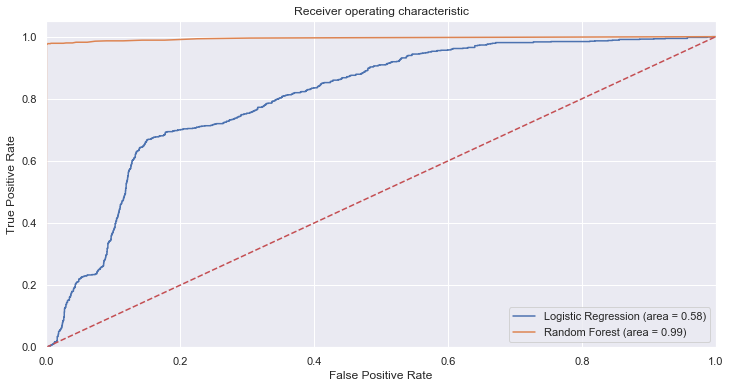

In [77]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

#ROC for logistic regression
logit_roc_auc = roc_auc_score(y_test, lr.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, lr.predict_proba(X_test)[:,1])

#ROC for Random Forrest
rf_roc_auc = roc_auc_score(y_test, rf.predict(X_test))
rf_fpr, rf_tpr, rf_thresholds = roc_curve(y_test, rf.predict_proba(X_test)[:,1])

#ROC Curve for Random Forest & Logistic Regression
plt.figure(figsize=(12,6))
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot(rf_fpr, rf_tpr, label='Random Forest (area = %0.2f)' % rf_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

## PR Eğrisi :
- Plot of Recall (x) vs Precision (y). 
- Precision = TruePositives / (TruePositives + FalsePositives)
- Recall = TruePositives / (TruePositives + FalseNegatives)
- Precision ve recall; bir sınıflandırıcının azınlık sınıfındaki performansını değerlendirmeyi mümkün kılar.
- Mükemmel beceriye sahip bir model (1,1) koordinatında bir nokta olarak gösterilir. İyi bir model (1,1) koordinatına doğru eğilen bir eğri ile temsil edilir.

In [210]:
y_score_dtc = dtc.predict_proba(X_test)[:,-1]
y_score_rf = rf.predict_proba(X_test)[:,-1]
y_score_mlp = nn.predict_proba(X_test)[:,-1]
from sklearn.metrics import average_precision_score, auc, roc_curve, precision_recall_curve
average_precision_rf = average_precision_score(y_test, y_score_rf)
average_precision_dtc = average_precision_score(y_test, y_score_dtc)
average_precision_mlp = average_precision_score(y_test, y_score_mlp)
print('Average precision-recall score RF: {}'.format(average_precision_rf))

Average precision-recall score RF: 0.9903244275754053


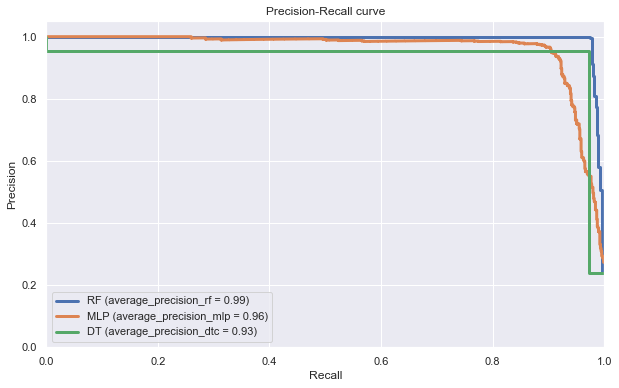

In [214]:
from sklearn.metrics import precision_recall_curve
import matplotlib.pyplot as plt

precision, recall, _ = precision_recall_curve(y_test, y_score_rf)
precisionmlp, recallmlp, _ = precision_recall_curve(y_test, y_score_mlp)
precisiondtc, recalldtc, _ = precision_recall_curve(y_test, y_score_dtc)
plt.figure(figsize=(10,6))
plt.step(recall, precision, linewidth=3, where='post', label='RF (average_precision_rf = %0.2f)' % average_precision_rf)
#plt.fill_between(recall, precision, step='post', alpha=0.2,color='b')
plt.step(recallmlp, precisionmlp, linewidth=3, where='post', label='MLP (average_precision_mlp = %0.2f)' % average_precision_mlp)
plt.step(recalldtc, precisiondtc, linewidth=3, where='post', label='DT (average_precision_dtc = %0.2f)' % average_precision_dtc)
plt.ylim([0.0, 1.05])
plt.xlim([0.0, 1.0])
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall curve')
plt.legend(loc="lower left")

## Feature Selection: Öznitelik Seçimi
####  Özellik Seçimi, makine öğreniminde modelinizin performansını büyük ölçüde etkileyen temel kavramlardan biridir. 
- Özellik Seçimi, tahmin değişkeninize veya ilgilendiğiniz çıktıya en çok katkıda bulunan özellikleri otomatik veya manuel olarak seçtiğiniz işlemdir.
- Bir model geliştirirken girdi değişkenlerinin sayısını azaltma işlemidir. Hem modellemenin hesaplama maliyetini azaltmak hem de bazı durumlarda modelin performansını artırmak için girdi değişkenlerinin sayısının azaltılması arzu edilir.
- **corr** : birbiriyle çok yüksek ilişkili özelliklerin içerisinden sadece birini ele alarak devam edilir
- **univariate** : Tek değişkenli özellik seçimi
- **RFE**
- **RFECV**
- **tree based**

### univariate : 
   - Tek değişkenli özellik seçiminde, k'nin en yüksek puanlama özellikleri hariç tümünü kaldıran **SelectKBest**, en iyi k özelliği bulur.
   - https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectKBest.html#sklearn.feature_selection.SelectKBest
   - İstatistiksel testler, çıktı değişkeni ile en güçlü ilişkiye sahip olan özellikleri seçmek için kullanılabilir. Scikit-learn kütüphanesi, belirli sayıda özellik seçmek için farklı istatistiksel testler ile kullanılabilen **SelectKBest** sınıfını sağlar. 
   - Burada en iyi 8 **(k=8)** özellik arasından seçim yapmak için negatif olmayan özellikler için ki kare **(score_func=chi²)** istatistik testini kullanır.

- k=5; **chi2** için acc:0.97 mcc:0.93 , **f_classif** için acc:0.981 mcc:0.949 oldu.
- k=8; **chi2** acc:0.991 mcc:0.975 , **f_classif** için acc:0.993 mcc:0.983 oldu.

In [78]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.feature_selection import f_classif #ANOVA F
# find best scored 8 features
%time select_feature = SelectKBest(f_classif, k=8).fit(X_train, y_train)

Wall time: 23.7 ms


           best features        Score
0     satisfaction_level  1976.085358
5          Work_accident   275.616945
4     time_spend_company   254.214834
3   average_montly_hours    84.666053
6  promotion_last_5years    52.689745
2         number_project    16.959694
7                   dept    12.052097
1        last_evaluation     2.799638


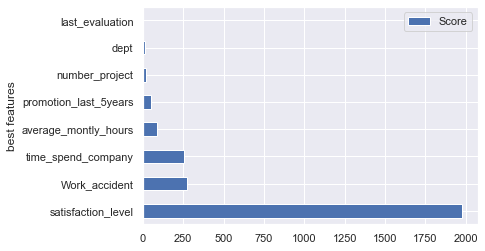

In [79]:
#print('Score list:', select_feature.scores_) #print('Feature list:', X_train.columns)
dfscores = pd.DataFrame(select_feature.scores_)
dfcolumns = pd.DataFrame(X.columns)
#concat
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['best features','Score']
print(featureScores.nlargest(8,'Score'))
featureScores.nlargest(8,'Score').plot(x='best features',y='Score',kind='barh')

Accuracy is:  0.9935982928781009


(2.0, 0.0)

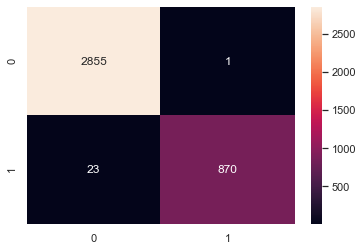

In [80]:
from sklearn.metrics import f1_score,confusion_matrix
from sklearn.metrics import accuracy_score
#En iyi k value degerindeki ozellikler secilirek fit edilir (k=8)
x_train_k = select_feature.transform(X_train)
x_test_k = select_feature.transform(X_test)
#random forest classifier: n_estimators=10 (default)
clf_rf_k = RandomForestClassifier(n_estimators=100)      
clr_rf_k = clf_rf_k.fit(x_train_k,y_train)
ac_k = accuracy_score(y_test,clf_rf_k.predict(x_test_k))
print('Accuracy is: ',ac_k)
cm_k = confusion_matrix(y_test,clf_rf_k.predict(x_test_k))
ax = sns.heatmap(cm_k,annot=True,fmt="d")

bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [81]:
matthews_corrcoef(y_test,clf_rf_k.predict(x_test_k))

0.9823404793157489

In [249]:
from sklearn.externals import joblib 
joblib.dump(rfecv, 'model_rfecv.pkl') 

['model_rfecv.pkl']

### RFE:
- Öznitelikleri tekrar tekrar kaldırarak ve kalan öznitelikler üzerine bir model oluşturarak çalışır.
- Hangi özelliklerin (ve özellik kombinasyonunun), hedef özelliği tahmin etmeye en çok katkıda bulunduğunu belirlemek için model doğruluğunu kullanır.
- Temel olarak, sınıflandırma yöntemlerinden birini kullanır (örn:random forest), özelliklerin her birine ağırlık atar. 
- Mutlak ağırlıkları en küçük olanlar mevcut set özelliklerinden budanır. 
- Bu prosedür, istenen özellik sayısına kadar budanmış sette tekrar tekrar tekrarlanır.
- https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFE.html

- En iyi **5** özellik için: **acc:0.993** ve **mcc:0.982** oldu.
- En iyi **8** özellik için: **acc:0.993** ve **mcc:0.981** oldu.

In [82]:
from sklearn.feature_selection import RFE
model = RandomForestClassifier(n_estimators = 100, random_state = 1)
%time rfe = RFE(model, 5)
%time rfe = rfe.fit(X_train, y_train)
print(rfe.support_)
print(rfe.ranking_)

Wall time: 0 ns
Wall time: 8.38 s
[ True  True  True  True  True False False False False]
[1 1 1 1 1 4 5 2 3]


In [83]:
print('Chosen best 5 feature by rfe:',X_train.columns[rfe.support_])

Chosen best 5 feature by rfe: Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company'],
      dtype='object')


Accuracy is:  0.9933315550813551


(2.0, 0.0)

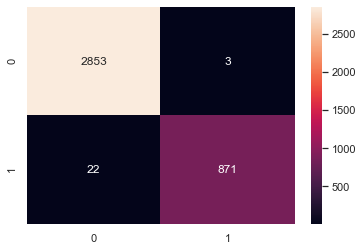

In [84]:
x_train_rfe = rfe.transform(X_train)
x_test_rfe = rfe.transform(X_test)
rf_rfe = RandomForestClassifier(n_estimators=100)      
rf_rfe = rf_rfe.fit(x_train_rfe,y_train)
ac_rfe = accuracy_score(y_test,rf_rfe.predict(x_test_rfe))
print('Accuracy is: ',ac_rfe)
cm_rfe = confusion_matrix(y_test,rf_rfe.predict(x_test_rfe))
ax = sns.heatmap(cm_rfe,annot=True,fmt="d")

bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)

In [85]:
matthews_corrcoef(y_test,rf_rfe.predict(x_test_rfe))

0.9815872755385059

In [250]:
from sklearn.externals import joblib 
joblib.dump(rf_rfe, 'model_rf_rfe.pkl') 

['model_rf_rfe.pkl']

### RFECV: Recursive feature elimination with cross validation
   - Sadece en iyi özellikleri bulmayacak, aynı zamanda en iyi doğruluk için kaç özelliğe ihtiyacımız olduğunu da bulacak.
   - https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.RFECV.html#examples-using-sklearn-feature-selection-rfecv

In [86]:
from sklearn.feature_selection import RFECV
rf_rfecv = RandomForestClassifier(n_estimators=100) 
%time rfecv = RFECV(estimator=rf_rfecv, step=1, cv=5, scoring='accuracy')   #5-fold cross-validation
%time rfecv = rfecv.fit(X_train, y_train)

print('Optimal number of features :', rfecv.n_features_)
print('Best features :', X_train.columns[rfecv.support_])

Wall time: 0 ns
Wall time: 1min 8s
Optimal number of features : 6
Best features : Index(['satisfaction_level', 'last_evaluation', 'number_project',
       'average_montly_hours', 'time_spend_company', 'dept'],
      dtype='object')


In [87]:
x_train_rfecv = rfecv.transform(X_train)
x_test_rfecv = rfecv.transform(X_test)

In [88]:
rfecv_ = rf_rfecv.fit(x_train_rfecv,y_train)
matthews_corrcoef(y_test,rfecv_.predict(x_test_rfecv))

0.9838129624872677

In [89]:
rfecv_.predict_proba(x_test_rfecv)

array([[0.  , 1.  ],
       [0.97, 0.03],
       [0.  , 1.  ],
       ...,
       [1.  , 0.  ],
       [1.  , 0.  ],
       [0.98, 0.02]])

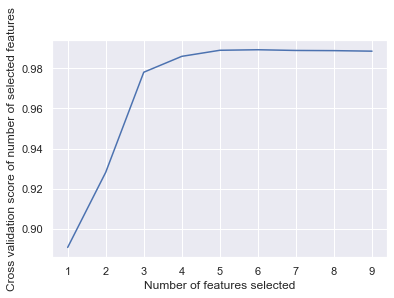

In [90]:
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Cross validation score of number of selected features")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

with open('model_rfecv','wb') as file:
    pickle.dump(rfecv,file)

In [251]:
joblib.dump(rfecv, 'model_rfecv.pkl')

['model_rfecv.pkl']

### Tree based feature selection
   - **Feature_importance** Ağaç Tabanlı Sınıflandırıcılarla birlikte gelen dahili bir sınıftır.
   - RandomForestClassifier ve ExtraTreesClassifier yöntemlerinde, özellik önemini taşıyan bir **"featureimportances attributes"** vardır (ne kadar yüksekse özellik o kadar önemlidir).
   - **Feature_importance** yöntemini kullanmak için, eğitim verilerinde ilişkili özellikler olmamalıdır. RandomForest her yinelemede rastgele seçim yapar, bu nedenle özellik önem listesi sırası değişebilir.
   - https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html#examples-using-sklearn-ensemble-randomforestclassifier
   - https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.ExtraTreesClassifier.html

Wall time: 1.38 s
[0.24858428 0.13375404 0.25219141 0.13308421 0.17760707 0.01539866
 0.00235703 0.02049323 0.01653006]
Wall time: 20 ms


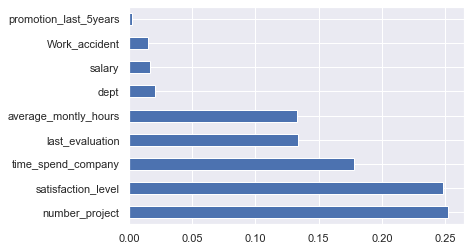

In [91]:
from sklearn.ensemble import ExtraTreesClassifier
model = ExtraTreesClassifier(n_estimators=100)
#model = RandomForestClassifier(n_estimators=100)
%time model.fit(X,y)
print(model.feature_importances_) #tree based classifiers -> feature_importances sınıfı kullanilir
#visualization
%time feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(9).plot(kind='barh')
plt.show()

#### >> Grafikte gördüğümüz gibi, en iyi 5 özellikten sonra özelliklerin önemi (feature_importances_) azalmaktadır.   Bu nedenle bu 5 özelliğe odaklanabiliriz.

## GridsearchCV 
- GridSearchCV, bir tahminci (estimator) için belirtilen parametre değerlerini arayarak hiper parametrelere ince ayar yapmak için kullanıma izin verir.

In [92]:
from sklearn.model_selection import GridSearchCV

In [93]:
from sklearn.svm import SVC
param_grid = {'C': [0.1,1, 10, 100], 'gamma': [1,0.1,0.01,0.001],'kernel': ['rbf', 'poly', 'sigmoid']}
%time grid = GridSearchCV(SVC(),param_grid,refit=True,verbose=2)
%time grid.fit(X_train,y_train)

Wall time: 0 ns
Fitting 3 folds for each of 48 candidates, totalling 144 fits
[CV] C=0.1, gamma=1, kernel=rbf ......................................


C:\Users\IlknurKaraduman\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:1978: FutureWarning:

The default value of cv will change from 3 to 5 in version 0.22. Specify it explicitly to silence this warning.

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


[CV] ....................... C=0.1, gamma=1, kernel=rbf, total=   2.2s
[CV] C=0.1, gamma=1, kernel=rbf ......................................


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.1s remaining:    0.0s


[CV] ....................... C=0.1, gamma=1, kernel=rbf, total=   1.8s
[CV] C=0.1, gamma=1, kernel=rbf ......................................
[CV] ....................... C=0.1, gamma=1, kernel=rbf, total=   1.7s
[CV] C=0.1, gamma=1, kernel=poly .....................................
[CV] ...................... C=0.1, gamma=1, kernel=poly, total=   1.6s
[CV] C=0.1, gamma=1, kernel=poly .....................................
[CV] ...................... C=0.1, gamma=1, kernel=poly, total=   1.7s
[CV] C=0.1, gamma=1, kernel=poly .....................................
[CV] ...................... C=0.1, gamma=1, kernel=poly, total=   1.9s
[CV] C=0.1, gamma=1, kernel=sigmoid ..................................
[CV] ................... C=0.1, gamma=1, kernel=sigmoid, total=   3.9s
[CV] C=0.1, gamma=1, kernel=sigmoid ..................................
[CV] ................... C=0.1, gamma=1, kernel=sigmoid, total=   4.3s
[CV] C=0.1, gamma=1, kernel=sigmoid ..................................
[CV] .

[Parallel(n_jobs=1)]: Done 144 out of 144 | elapsed:  7.6min finished


Wall time: 7min 43s


GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto_deprecated', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='warn', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001],
                         'kernel': ['rbf', 'poly', 'sigmoid']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=2)

In [94]:
print(grid.best_estimator_)

SVC(C=100, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='rbf', max_iter=-1,
    probability=False, random_state=None, shrinking=True, tol=0.001,
    verbose=False)


In [95]:
grid_predictions = grid.predict(X_test)
print(confusion_matrix(y_test,grid_predictions))
print(classification_report(y_test,grid_predictions))

[[2818   38]
 [  65  828]]
              precision    recall  f1-score   support

         0.0       0.98      0.99      0.98      2856
         1.0       0.96      0.93      0.94       893

    accuracy                           0.97      3749
   macro avg       0.97      0.96      0.96      3749
weighted avg       0.97      0.97      0.97      3749



- **SVC:**
- GridSearchCV ile **SVC** için en iyi parametreler:

- x_train_rfecv ile yani 6 özellik seçimi ile eğitilince:

In [96]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
%time clf = GridSearchCV(SVC(gamma='auto'), {'C': [1,10,20], 'kernel': ['rbf','linear']}, cv=5, return_train_score=False)
%time clf.fit(x_train_rfecv, y_train)
clf.cv_results_

Wall time: 0 ns
Wall time: 1min 10s


{'mean_fit_time': array([1.99338999, 1.77054071, 1.42924147, 2.6207231 , 1.2694355 ,
        3.37080741]),
 'std_fit_time': array([0.21122237, 0.15294381, 0.05853696, 0.1729969 , 0.06360558,
        0.33200328]),
 'mean_score_time': array([0.3262013 , 0.16318035, 0.18138895, 0.16678238, 0.16451874,
        0.15883679]),
 'std_score_time': array([0.06461395, 0.0323672 , 0.02542291, 0.0207743 , 0.01996154,
        0.01256987]),
 'param_C': masked_array(data=[1, 1, 10, 10, 20, 20],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'param_kernel': masked_array(data=['rbf', 'linear', 'rbf', 'linear', 'rbf', 'linear'],
              mask=[False, False, False, False, False, False],
        fill_value='?',
             dtype=object),
 'params': [{'C': 1, 'kernel': 'rbf'},
  {'C': 1, 'kernel': 'linear'},
  {'C': 10, 'kernel': 'rbf'},
  {'C': 10, 'kernel': 'linear'},
  {'C': 20, 'kernel': 'rbf'},
  {'C': 20, 'kernel': 'linear'}],


In [97]:
clf.best_params_

{'C': 20, 'kernel': 'rbf'}

In [98]:
clf.best_score_

0.9458474124133025

In [99]:
matthews_corrcoef(y_test,clf.predict(x_test_rfecv))

0.8825876775492222

- x_train_rfe ile yani 5 özellik seçimi ile eğitilince:

In [100]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
%time clf = GridSearchCV(SVC(gamma='auto'), {'C': [1,10,20],'kernel': ['rbf','linear']}, cv=5, return_train_score=False)
%time clf.fit(x_train_rfe, y_train)
clf.best_params_

Wall time: 0 ns
Wall time: 1min 9s


{'C': 20, 'kernel': 'rbf'}

In [101]:
clf.best_score_

0.9478036635248088

In [102]:
matthews_corrcoef(y_test,clf.predict(x_test_rfe))

0.8868130118788837

- **LogisticRegression:** GridSearchCV

In [103]:
param_grid = {'C': np.arange(1e-03, 2, 0.01)} # hyper-parameter list to fine-tune
log_gs = GridSearchCV(LogisticRegression(solver='liblinear', # setting GridSearchCV
                                         class_weight="balanced", 
                                         random_state=7),
                      iid=True,
                      return_train_score=True,
                      param_grid=param_grid,
                      scoring='roc_auc',
                      cv=10)

%time log_grid = log_gs.fit(x_train_rfe, y_train)
log_opt = log_grid.best_estimator_
results = log_gs.cv_results_

print('='*20)
print("best params: " + str(log_gs.best_estimator_))
print("best params: " + str(log_gs.best_params_))
print('best score:', log_gs.best_score_)
print('mcc:', matthews_corrcoef(y_test,log_gs.predict(x_test_rfe)))
print('='*20)

Wall time: 1min 25s
best params: LogisticRegression(C=1.9809999999999997, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=100, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=7, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)
best params: {'C': 1.9809999999999997}
best score: 0.8003165214836194
mcc: 0.4568676782219655


- **GridSearchCV** ile en iyi model ve hiperparametreleri bulma:

In [219]:
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

model_params = {
    'svm': {
        'model': svm.SVC(gamma='auto'),
        'params' : {
            'C': [1,10,20],
            'kernel': ['rbf','linear']
        }  
    },
    'random_forest': {
        'model': RandomForestClassifier(),
        'params' : {
            'n_estimators': [1,5,10,100]
        }
    },
    'logistic_regression' : {
        'model': LogisticRegression(solver='liblinear',multi_class='auto'),
        'params': {
            'C': [1,5,10]
        }
    }
}

In [228]:
scores = []

for model_name, mp in model_params.items():
    %time clf =  GridSearchCV(mp['model'], mp['params'], cv=5, return_train_score=False)
    %time clf.fit(x_train_rfe, y_train)
    scores.append({
        'model': model_name,
        'best_score': clf.best_score_,
        'best_params': clf.best_params_
    })
    
dfgrid = pd.DataFrame(scores,columns=['model','best_score','best_params'])
dfgrid

Wall time: 0 ns
Wall time: 39.3 s
Wall time: 0 ns
Wall time: 5.57 s
Wall time: 997 µs
Wall time: 282 ms


,model,best_score,best_params
0,svm,0.947804,"{'C': 20, 'kernel': 'rbf'}"
1,random_forest,0.988885,{'n_estimators': 100}
2,logistic_regression,0.768006,{'C': 1}


- **RandomizedSearchCV:**
- Yinelemelerin sayısını azaltmak ve rastgele parametre birleşimi ile RandomizedSearchCV'yi kullanın. Denemek için çok fazla parametreniz olduğunda ve egzersiz süreniz daha uzun olduğunda bu yararlıdır. Hesaplama maliyetini azaltmaya yardımcı olur

In [106]:
from sklearn.model_selection import RandomizedSearchCV
rs = RandomizedSearchCV(SVC(gamma='auto'), 
                        {
                            'C': [1,10,20],
                            'kernel': ['rbf','linear']
                        }, 
                        cv=5, 
                        return_train_score=False, 
                        n_iter=2
                       )
%time rs.fit(x_train_rfe, y_train)
pd.DataFrame(rs.cv_results_)[['param_C','param_kernel','mean_test_score']]

Wall time: 29 s


,param_C,param_kernel,mean_test_score
0,10,linear,0.76196
1,1,linear,0.76196


- RandomizedSearchCV ile **DecisionTreeClassifier** parametreleri

In [107]:
from scipy.stats import randint
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV

param_dist = {"max_depth": [3, None],
              "max_features": randint(1, 5),
              "min_samples_leaf": randint(1, 5),
              "criterion": ["gini", "entropy"]}

tree = DecisionTreeClassifier()

%time tree_cv = RandomizedSearchCV(tree, param_dist, cv=5)

%time tree_cv.fit(x_train_rfe, y_train)

print("Tuned Decision Tree Parameters: {}".format(tree_cv.best_params_))
print("Best score is {}".format(tree_cv.best_score_))
print('mcc:', matthews_corrcoef(y_test,tree_cv.predict(x_test_rfe)))

Wall time: 0 ns
Wall time: 936 ms
Tuned Decision Tree Parameters: {'criterion': 'gini', 'max_depth': None, 'max_features': 4, 'min_samples_leaf': 1}
Best score is 0.9755468611061711
mcc: 0.9539698472083478


## Feature Extraction : 
- İlk ham veri kümesinin işlenmek üzere daha yönetilebilir gruplara indirgeneceği boyutsallık azaltma sürecidir. Bu büyük veri kümelerinin bir özelliği, işlemek için çok fazla bilgi işlem kaynağı gerektiren çok sayıda değişkendir. Feature Extraction, değişkenleri seçen ve / veya özelliklerle birleştiren yöntemlerin adıdır ve işlenmesi gereken veri miktarını etkili bir şekilde azaltırken, orijinal veri kümesini hala doğru ve tamamen açıklar.
- Neden önemli?
- Önemli veya ilgili bilgileri kaybetmeden işlem için gereken kaynak sayısını azaltmanız gerektiğinde yararlıdır. Feature Extraction, belirli bir analiz için gereksiz veri miktarını da azaltabilir. Ayrıca, verilerin azaltılması ve makinenin değişken kombinasyonlar (özellikler) oluşturma çabaları, makine öğrenme sürecinde öğrenme hızını ve genelleme adımlarını kolaylaştırır .
#### Dimensionality Reduction
### PCA: principle component analysis
- PCA'nın daha iyi performansı için önce verileri normalleştirmeniz gerekir.
- https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html#examples-using-sklearn-decomposition-pca
- PCA, veri kümesini sıkıştırılmış bir forma dönüştürmek için doğrusal cebir kullanır. Genellikle buna veri azaltma tekniği denir.
- PCA'nın bir özelliği, dönüştürülen sonuçtaki boyutların veya ana bileşenin sayısını seçebilmenizdir.
- https://machinelearningmastery.com/feature-selection-machine-learning-python/
- https://medium.com/analytics-vidhya/feature-extraction-techniques-pca-lda-and-t-sne-df0459c723aa
- PCA, veri kümesini, döndürülen özelliklerin istatistiksel olarak ilintisiz olacağı şekilde döndüren bir yöntemdir. Bu rotasyondan sonra, verileri açıklamak için ne kadar önemli olduklarına göre, yeni özelliklerin yalnızca bir alt kümesinin seçilmesi takip eder. Bu şekilde, PCA, temel bileşenlerin sadece bir kısmını muhafaza ederek boyutsallığın azaltılması için kullanılabilir. PCA'nın denetimsiz bir yöntem olduğunu ve döndürmeyi bulurken herhangi bir sınıf bilgisi kullanmadığını belirtmek önemlidir. Sadece verilerdeki korelasyonlara bakar.
- 

Wall time: 719 ms


Text(0, 0.5, 'explained_variance_ratio_')

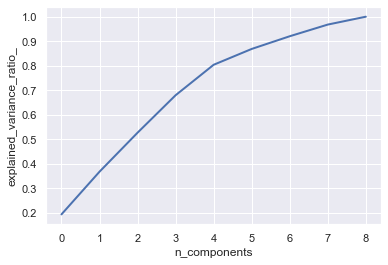

In [109]:
#normalization
x_train_N = (X_train-X_train.mean())/(X_train.max()-X_train.min())
x_test_N = (X_test-X_test.mean())/(X_test.max()-X_test.min())

from sklearn.decomposition import PCA
pca = PCA()
%time pca.fit(X_train)

plt.plot(np.cumsum(pca.explained_variance_ratio_), linewidth=2)
plt.xlabel('n_components')
plt.ylabel('explained_variance_ratio_')
#Seçilen bileşenlerin her biri tarafından açıklanan varyans yüzdesi: explained_variance_ratio_

- önce verilen özellik kümesinden üretilecek ana bileşen sayısını belirlememiz gerekiyor. Bu, bileşen sayısının bir fonksiyonu olarak kümülatif açıklanan varyans oranına bakılarak belirlenebilir 
- Bu eğri, 9-boyutlu bir varyans birinci içinde ne kadar toplam miktarını belirler K bileşenleri. Örneğin, segmentasyon veri kümesinde, ilk 4 bileşenin varyansın yaklaşık %80'ini içerdiğini, varyansın yaklaşık %100'ünü tanımlamak için ise yaklaşık 8 bileşene ihtiyacımız olduğunu görüyoruz.

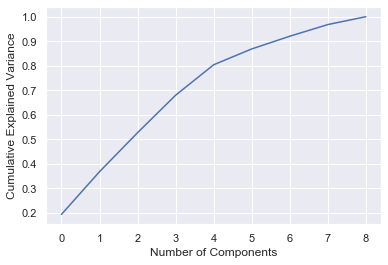

In [165]:
pca = PCA()
pca.fit(X_train)
# Plotting the Cumulative Summation of the Explained Variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance') #her bilesen icin
plt.show(block=True)

In [166]:
pca.explained_variance_ratio_

array([0.19425883, 0.17391728, 0.15900583, 0.15271047, 0.12413014,
       0.06452368, 0.05178443, 0.04755442, 0.03211492])

- Bu nedenle, **n_components = 9** olur.
- Daha sonra Random Forest ile modeli eğitip predict ettim.

In [175]:
%time pca = PCA(n_components=9)
%time pca.fit(X_train)
trainX_pca = pca.transform(X_train)
testX_pca = pca.transform(X_test)

Wall time: 0 ns
Wall time: 7.74 ms


In [176]:
trainX_pca

array([[ 8.11155643e-01, -1.38787120e-03,  3.11143973e-01, ...,
        -9.25101225e-02, -5.76981776e-02, -2.24957920e-02],
       [-7.51148524e-02, -2.58534574e-01, -1.75975287e-01, ...,
        -1.10923437e-02,  1.30614434e-02, -2.95018849e-02],
       [-8.57923116e-02, -5.19114962e-01, -4.42763912e-01, ...,
        -1.62841086e-01, -1.39773879e-02,  1.58786107e-03],
       ...,
       [ 8.57434145e-01,  2.60195935e-01, -3.07469142e-02, ...,
         4.06055017e-01,  3.70320978e-01, -1.41560271e-01],
       [-2.30541059e-01,  2.71310727e-01, -2.64524199e-01, ...,
         2.17997606e-02, -3.53279335e-02, -2.21000487e-04],
       [ 8.46693998e-01,  1.27362063e-01, -2.86381708e-01, ...,
        -8.60165562e-02, -1.81012768e-02, -6.96058339e-03]])

In [177]:
testX_pca

array([[-0.26229528,  0.68820538, -0.23844149, ..., -0.04492315,
        -0.06413577,  0.01106267],
       [ 0.83908134,  0.089145  , -0.34316953, ...,  0.13217382,
        -0.04428109, -0.04256155],
       [-0.28155004,  0.49688113,  0.73528996, ..., -0.05962467,
        -0.08051142, -0.00196474],
       ...,
       [-0.13956601,  0.03203699,  0.61239339, ..., -0.04526479,
        -0.20956488,  0.00848612],
       [-0.10024422, -0.38445465,  0.4193965 , ..., -0.02522909,
        -0.1509164 , -0.00314251],
       [-0.10469521,  0.12461483, -0.37646352, ...,  0.07002619,
         0.06652833, -0.02083205]])

In [178]:
forest = RandomForestClassifier(n_estimators=100, max_features='sqrt', max_depth=15)
%time forest.fit(trainX_pca, y_train)
prediction = forest.predict(testX_pca)
print("Classification Report / Random Forest")
print("----------------------------------------------------")
print(classification_report(y_test, prediction))

Wall time: 5.02 s
Classification Report / Random Forest
----------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.98      1.00      0.99      2856
         1.0       0.99      0.95      0.97       893

    accuracy                           0.99      3749
   macro avg       0.99      0.97      0.98      3749
weighted avg       0.99      0.99      0.99      3749



In [179]:
matthews_corrcoef(y_test,prediction)

0.9616122494072927

(9.0, 0.0)

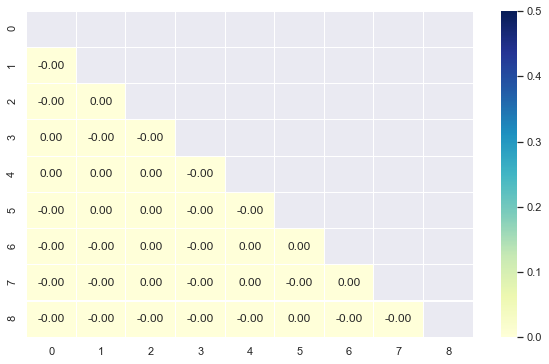

In [180]:
dfcorr = pd.DataFrame(trainX_pca)
corr = dfcorr.corr()
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
# Heatmap
plt.figure(figsize=(10, 6))
ax=sns.heatmap(corr,
            vmax=.5,
            mask=mask,
            annot=True, fmt='.2f',
            linewidths=.2, cmap="YlGnBu")
bottom, top = ax.get_ylim()
ax.set_ylim(bottom + 0.5, top - 0.5)


### LDA: Linear Discriminant Analysis
- her sınıfın ortalaması arasındaki mesafeyi en üst düzeye çıkarmayı ve sınıfın kendisindeki yayılmayı en aza indirmeyi amaçlamaktadır. LDA bu nedenle sınıflar içinde ve sınıflar arasında önlem olarak kullanılır. Bu iyi bir seçimdir, çünkü verileri daha düşük boyutlu bir alana yansıtırken her sınıfın araçları arasındaki mesafeyi en üst düzeye çıkarmak daha iyi sınıflandırma sonuçlarına yol açabilir.
- LDA için gerekli bileşen sayısının bir fonksiyonu olarak kümülatif açıklanan varyans oranı.

In [117]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
lda = LDA(store_covariance=True)
lda.fit(X_train,y_train)
lda.explained_variance_ratio_

array([1.])

In [276]:
(lda.covariance_)

AttributeError: 'LinearDiscriminantAnalysis' object has no attribute 'covariance_'

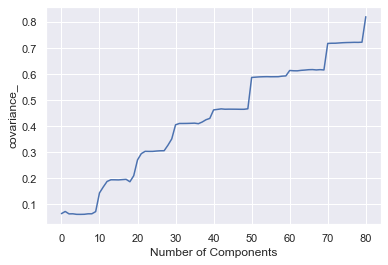

In [119]:
plt.figure()
plt.plot(np.cumsum(lda.covariance_))
plt.xlabel('Number of Components')
plt.ylabel('covariance_')
plt.show(block=True)

In [121]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

In [124]:
lda = LinearDiscriminantAnalysis(n_components=1)
lda.fit(X_train, y_train)
trainX_lda = lda.transform(X_train)
testX_lda = lda.transform(X_test)
forest = RandomForestClassifier(n_estimators=100, max_features='sqrt', max_depth=15)
%time forest.fit(trainX_lda, y_train)
prediction = forest.predict(testX_lda)
print("Classification Report / Random Forest")
print("----------------------------------------------------")
print(classification_report(y_test, prediction))

Wall time: 2.17 s
Classification Report / Random Forest
----------------------------------------------------
              precision    recall  f1-score   support

         0.0       0.89      0.91      0.90      2856
         1.0       0.69      0.66      0.67       893

    accuracy                           0.85      3749
   macro avg       0.79      0.78      0.79      3749
weighted avg       0.85      0.85      0.85      3749



In [125]:
matthews_corrcoef(y_test,prediction)

0.5750561977073148

In [129]:
lda = LinearDiscriminantAnalysis()
lda.fit(X_train, y_train)
testX_lda = lda.transform(X_test)
trainX_lda = lda.transform(X_train)
print('Original number of features:', X_train.shape[1])
print('Reduced number of features:', trainX_lda.shape[1])

Original number of features: 9
Reduced number of features: 1


In [130]:
trainedforest = RandomForestClassifier(n_estimators=700).fit(trainX_lda,y_train)
predictionforest = trainedforest.predict(testX_lda)
print(confusion_matrix(y_test,predictionforest))
print(classification_report(y_test,predictionforest))

[[2563  293]
 [ 174  719]]
              precision    recall  f1-score   support

         0.0       0.94      0.90      0.92      2856
         1.0       0.71      0.81      0.75       893

    accuracy                           0.88      3749
   macro avg       0.82      0.85      0.84      3749
weighted avg       0.88      0.88      0.88      3749



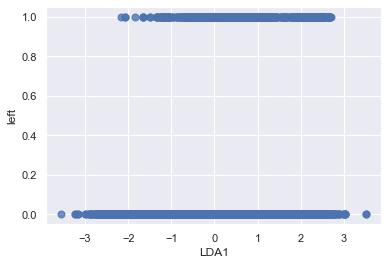

In [147]:
df_= pd.concat([X_train, y_train], axis = 1)
df_["LDA1"] = trainX_lda[:]
sns.regplot(data = df_[["LDA1","left"]], x = "LDA1",y = "left", fit_reg=False, scatter_kws = {'s':50}, )